## Problem Statement - Credit card fraud detection using Naive Bayes Algorithm 

Perform Fraud detection in credit card transactions, using Naive Bayes Algorithm 

The data was made by credit cards in September 2013 by European cardholders. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions. It contains only numerical input variables which are the result of a PCA transformation. The original features and more background information about the data is not provided.


### What is Naive Bayesian Algorithm?

In machine learning, Naïve Bayes classification is a straightforward and powerful algorithm for the classification task. Naïve Bayes classification is based on applying Bayes’ theorem with strong independence assumption between the features. Naïve Bayes classification produces good results when we use it for textual data analysis such as Natural Language Processing.

Naïve Bayes models are also known as simple Bayes or independent Bayes. All these names refer to the application of Bayes’ theorem in the classifier’s decision rule. Naïve Bayes classifier applies the Bayes’ theorem in practice. This classifier brings the power of Bayes’ theorem to machine learning.

#### How Naive Bayes works?

Naïve Bayes Classifier uses the Bayes’ theorem to predict membership probabilities for each class such as the probability that given record or data point belongs to a particular class. The class with the highest probability is considered as the most likely class. This is also known as the Maximum A Posteriori (MAP).

The MAP for a hypothesis with 2 events A and B is

MAP (A)

= max (P (A | B))

= max (P (B | A) * P (A))/P (B)

= max (P (B | A) * P (A))

Here, P (B) is evidence probability. It is used to normalize the result. It remains the same, So, removing it would not affect the result.

Naïve Bayes Classifier assumes that all the features are unrelated to each other. Presence or absence of a feature does not influence the presence or absence of any other feature.

In real world datasets, we test a hypothesis given multiple evidence on features. So, the calculations become quite complicated. To simplify the work, the feature independence approach is used to uncouple multiple evidence and treat each as an independent one.

#### Types of Naive Bayes algorithm

There are 3 types of Naïve Bayes algorithm. The 3 types are listed below:-

- Gaussian Naïve Bayes

- Multinomial Naïve Bayes

- Bernoulli Naïve Bayes

These 3 types of algorithm are explained below.

Gaussian Naïve Bayes algorithm -
When we have continuous attribute values, we made an assumption that the values associated with each class are distributed according to Gaussian or Normal distribution. For example, suppose the training data contains a continuous attribute x. We first segment the data by the class, and then compute the mean and variance of x in each class. Let µi be the mean of the values and let σi be the variance of the values associated with the ith class. 

Multinomial Naïve Bayes algorithm -
With a Multinomial Naïve Bayes model, samples (feature vectors) represent the frequencies with which certain events have been generated by a multinomial (p1, . . . ,pn) where pi is the probability that event i occurs. Multinomial Naïve Bayes algorithm is preferred to use on data that is multinomially distributed. It is one of the standard algorithms which is used in text categorization classification.

Bernoulli Naïve Bayes algorithm -
In the multivariate Bernoulli event model, features are independent boolean variables (binary variables) describing inputs. Just like the multinomial model, this model is also popular for document classification tasks where binary term occurrence features are used rather than term frequencies.

### 1.Import Libraries

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

### 2. Load the data

In [3]:
df = pd.read_csv("creditcard.csv")
df.shape

(284807, 31)

There are 284807 rows and 31 coloums.

### 3.Exploratory Data Analysis

#### 3.a.High-level exploratory research

In [4]:
#check descriptive statistics that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.758702e-12,-8.252296e-13,-9.637438e-13,8.316234e-13,1.592013e-13,4.247308e-13,-3.050183e-13,8.692882e-14,-1.179710e-12,...,-3.406538e-13,-5.713357e-13,-9.725290e-13,1.464144e-12,-6.989090e-13,-5.615254e-13,3.332111e-12,-3.518885e-12,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [5]:
#check concise summary of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

All the variables are numerical - int64 or float64. None of the variables are categorical('object').


In [6]:
#drop unnecessary variables
df = df.drop(['Time'], axis = 1)

In [7]:
#check number of unique values
df.nunique()

V1        275653
V2        275655
V3        275657
V4        275654
V5        275657
V6        275652
V7        275651
V8        275643
V9        275656
V10       275646
V11       275648
V12       275654
V13       275657
V14       275653
V15       275653
V16       275645
V17       275646
V18       275655
V19       275645
V20       275632
V21       275617
V22       275644
V23       275611
V24       275645
V25       275640
V26       275647
V27       275597
V28       275558
Amount     32767
Class          2
dtype: int64

In [8]:
#retrieve the numeric columns
ncols = df.columns.difference(['Class'])
ncols

Index(['Amount', 'V1', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17',
       'V18', 'V19', 'V2', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26',
       'V27', 'V28', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9'],
      dtype='object')

#### 3.b. Univariate analysis

In [9]:
#check class balance for dependent variable
temp = df["Class"].value_counts()
df1 = pd.DataFrame({'label': temp.index,'count': temp.values})
df1

,label,count
0,0,284315
1,1,492


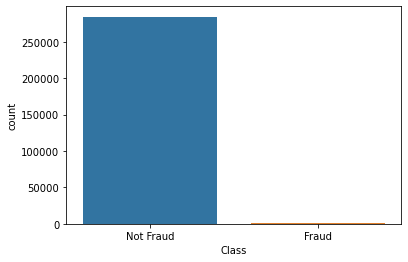

In [10]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

# visualize the target variable
g = sns.countplot(df['Class'])
g.set_xticklabels(['Not Fraud','Fraud'])
plt.show()

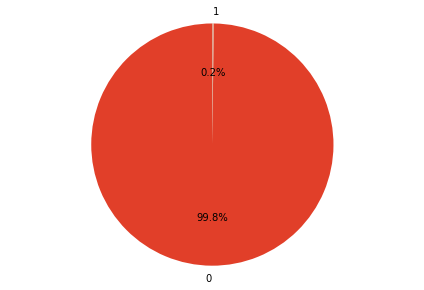

In [11]:
#pieplot
colors = ["#E13F29", "#D69A80", "#D63B59", "#AE5552", "#CB5C3B", "#EB8076", "#96624E"]

plt.pie(
    df1['count'],
    labels = df1['label'],
    shadow = False,
    colors = colors,
    startangle=90,
    autopct='%1.1f%%'
)
plt.axis('equal')
plt.tight_layout()
plt.show()

We need to handle the imbalanced data.

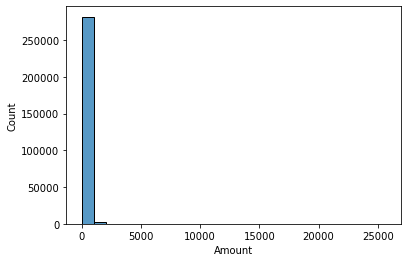

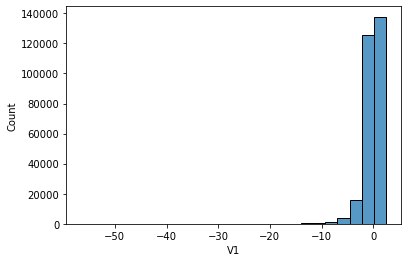

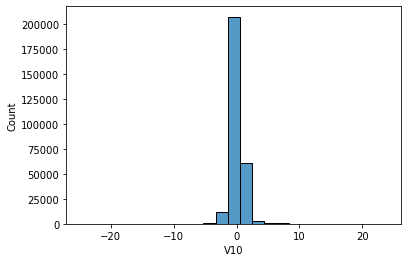

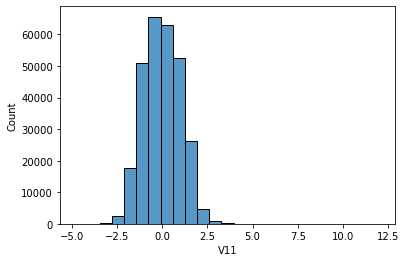

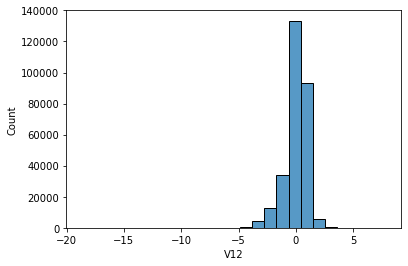

...

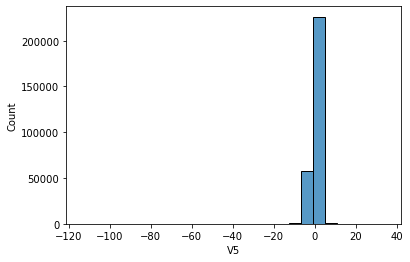

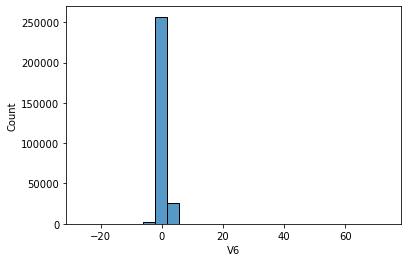

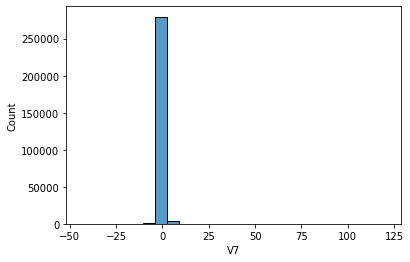

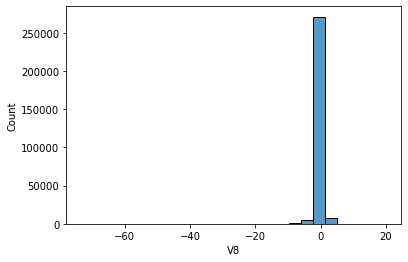

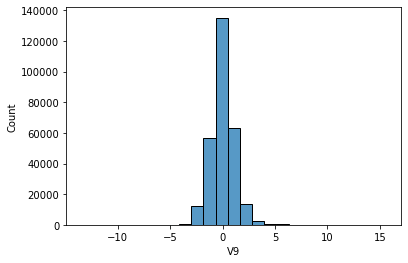

In [12]:
#plot histogram plots for the numerical independent variables
for col in ncols: 
    sns.histplot(df[col],bins=25)
    plt.show()


Fields like Amount, V4,V10 are slightly left-skewed, whereas fields like V1, V2,V16, V17 are slightly right-skewed and fields like  V9, V11, V12, V13, V14, V15, V18, V19, V22, V24, V25, V26 have almost normal distribution

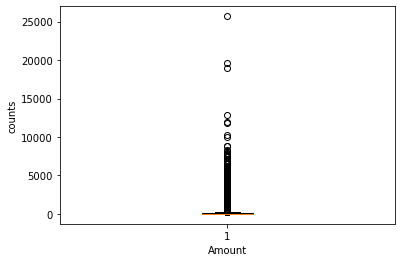

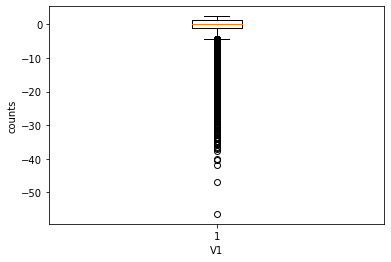

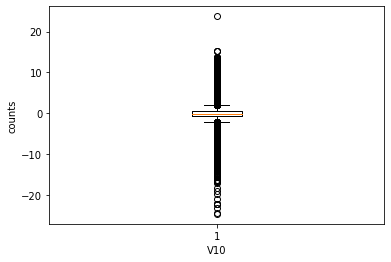

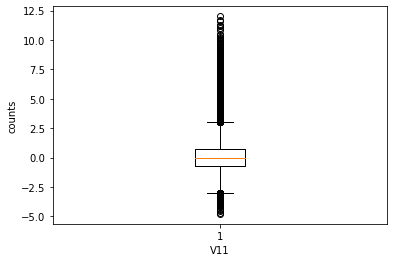

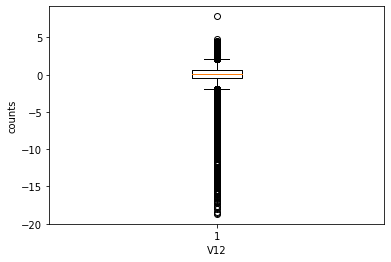

...

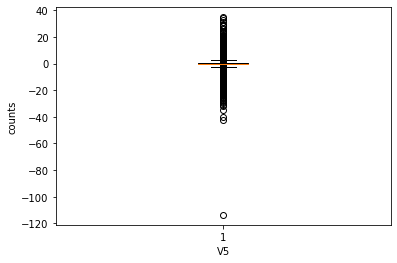

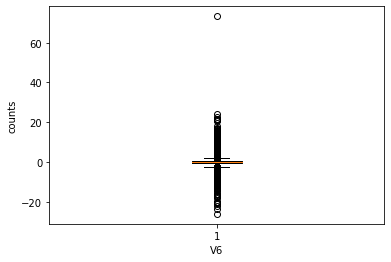

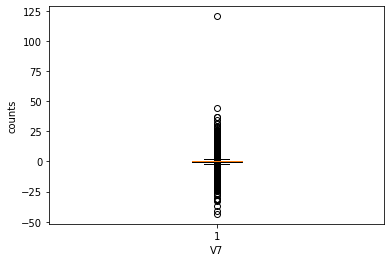

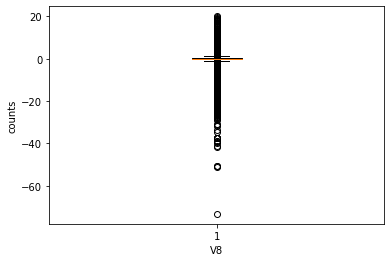

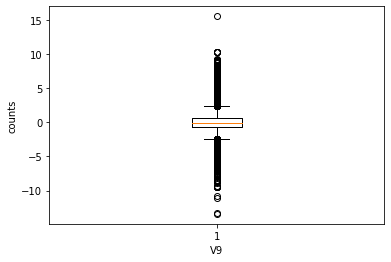

In [15]:
#plot box plots for the numerical variables -  check for outliers
for col in ncols: 
    plt.boxplot(df[col])
    plt.xlabel(col)
    plt.ylabel('counts')
    plt.show()

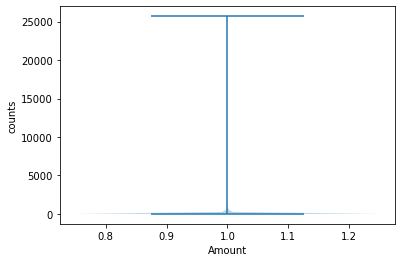

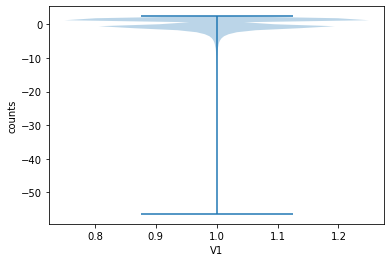

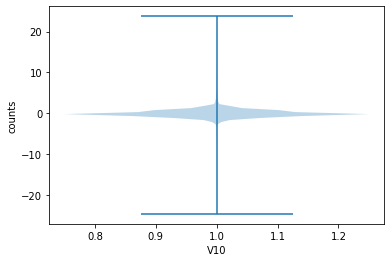

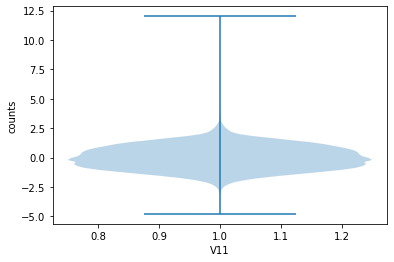

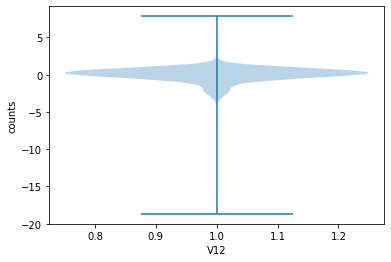

...

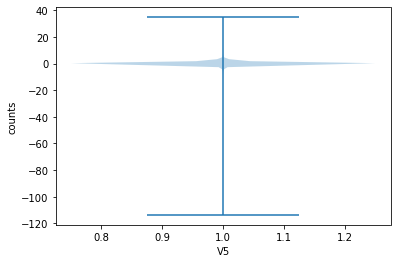

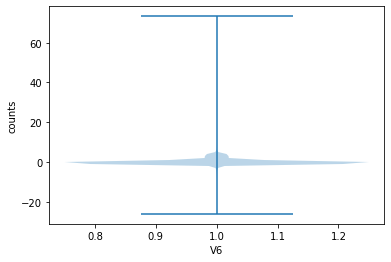

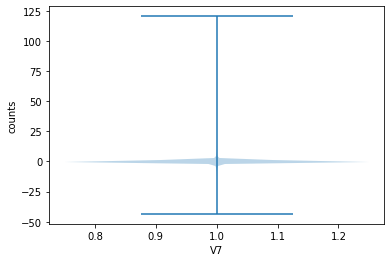

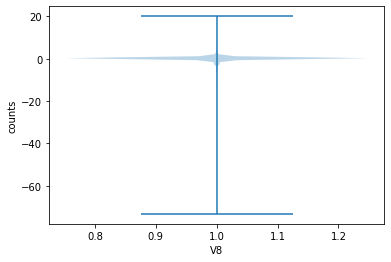

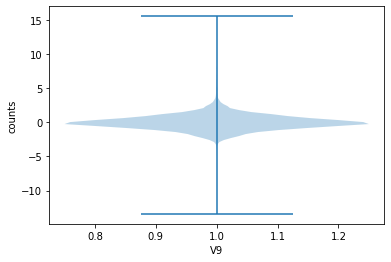

In [16]:
#plot violin plots for the numerical variables
for col in ncols: 
    plt.violinplot(df[col])
    plt.xlabel(col)
    plt.ylabel('counts')
    plt.show()

A violin plot depicts distributions of numeric data for one or more groups using density curves. The width of each curve corresponds with the approximate frequency of data points in each region. 

#### 3.c. Bivariate Analysis

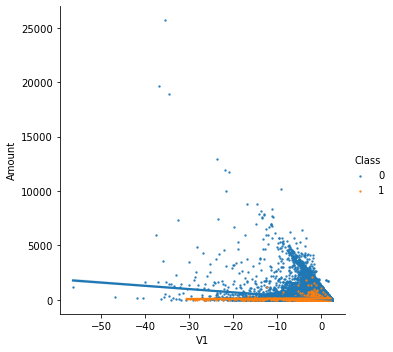

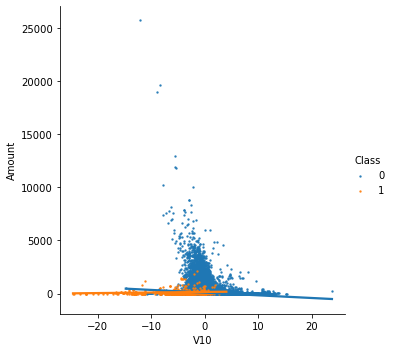

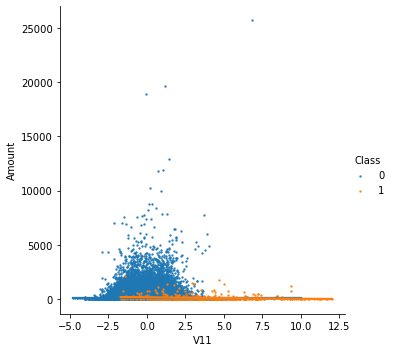

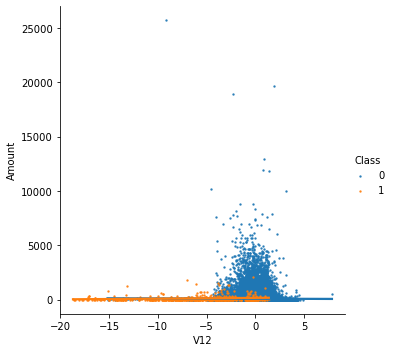

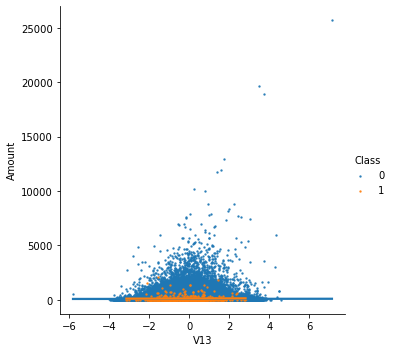

...

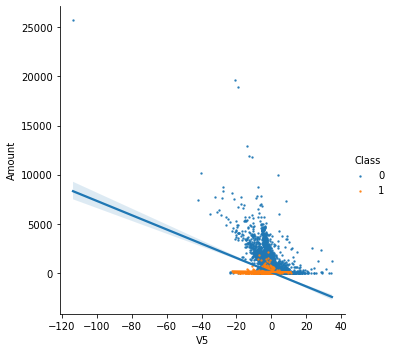

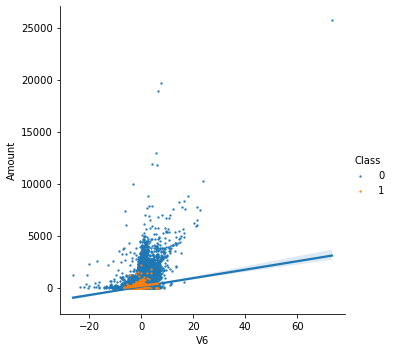

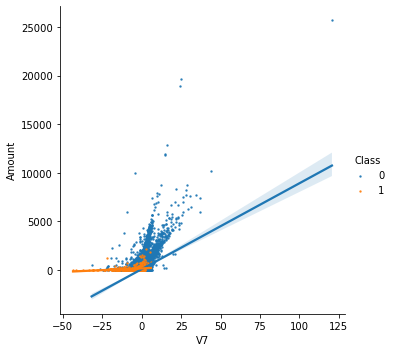

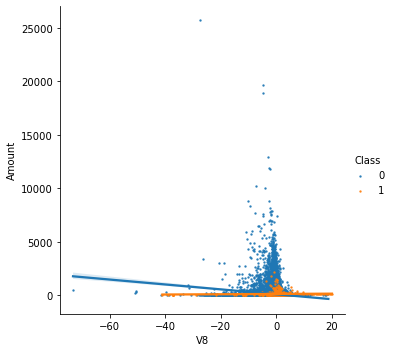

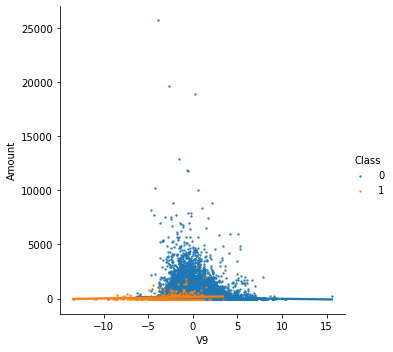

In [17]:
for c in ncols:
    if c != 'Amount':
        s = sns.lmplot(x=c, y='Amount',data=df, hue='Class', fit_reg=True,scatter_kws={'s':2})
        plt.show()


  V2, V5 and Amount are Inversely co-related.
    
  V7 and V20 and Amount are directly corelated.  

#### 3.d. Multivariate analysis

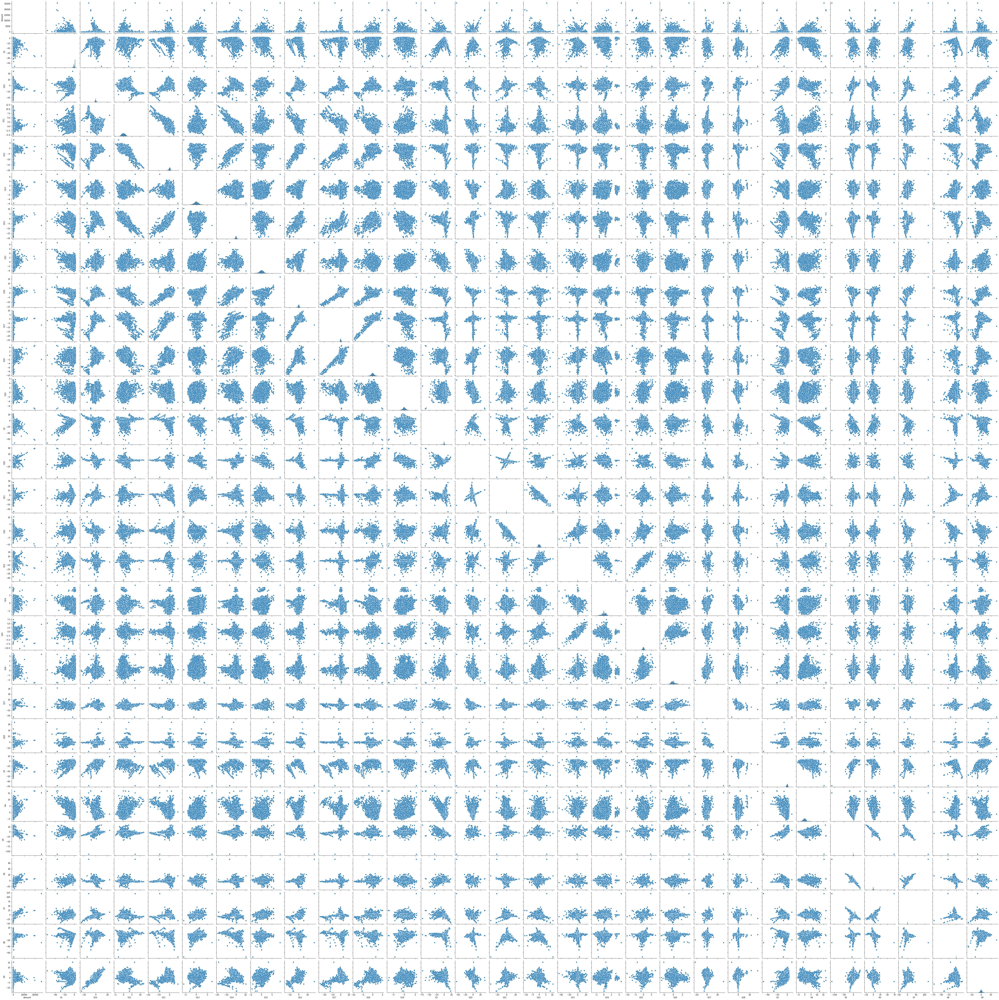

In [15]:
c = df.columns.difference(['Class'])
sns.pairplot(df[c])
plt.show()

#### 3.e. Check missing values

In [18]:
# check missing values in numerical variables
df.isnull().sum()

V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

#### 3.f. Feature Correlation

In [21]:
#find the correlation among the columns using pearson method
corrmat = df.corr(method="pearson")
corrmat.head(5)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
V1,1.000000e+00,3.777823e-12,-2.118614e-12,-1.733159e-13,-3.473231e-12,-1.306165e-13,-1.116494e-13,2.114527e-12,3.016285e-14,-2.615192e-12,...,-3.276238e-12,2.281863e-12,-2.969746e-12,-1.029876e-12,1.144179e-12,1.835263e-12,7.624804e-12,-9.769215e-13,-0.227709,-0.101347
V2,3.777823e-12,1.000000e+00,2.325661e-12,-2.314981e-12,-1.831952e-12,9.438444e-13,5.403436e-12,2.133785e-14,3.238513e-13,1.463282e-12,...,2.280202e-12,-2.548560e-13,-4.856120e-12,6.431308e-13,-9.423730e-13,-4.129100e-13,-9.856545e-13,2.525513e-12,-0.531409,0.091289
V3,-2.118614e-12,2.325661e-12,1.000000e+00,2.046235e-13,-4.032993e-12,-1.574471e-13,3.405586e-12,-1.272385e-12,-6.812351e-13,-1.609126e-12,...,6.736294e-13,-8.909339e-13,4.147209e-12,3.407636e-12,5.712956e-13,-2.577274e-12,-5.041444e-12,5.189109e-12,-0.210880,-0.192961
V4,-1.733159e-13,-2.314981e-12,2.046235e-13,1.000000e+00,-2.552389e-13,1.084041e-12,8.135064e-13,7.334818e-13,-7.143069e-13,-1.938143e-12,...,-2.696370e-12,4.347776e-13,-4.160969e-12,-2.368743e-12,1.619944e-12,-3.043100e-13,-1.456066e-12,-2.832372e-12,0.098732,0.133447
V5,-3.473231e-12,-1.831952e-12,-4.032993e-12,-2.552389e-13,1.000000e+00,-6.934789e-14,1.573956e-11,-2.038243e-12,-1.000756e-12,-7.200329e-13,...,-1.751796e-12,7.095269e-13,3.616075e-12,-2.808776e-13,1.451126e-12,-1.896141e-13,-2.124559e-12,1.010196e-11,-0.386356,-0.094974


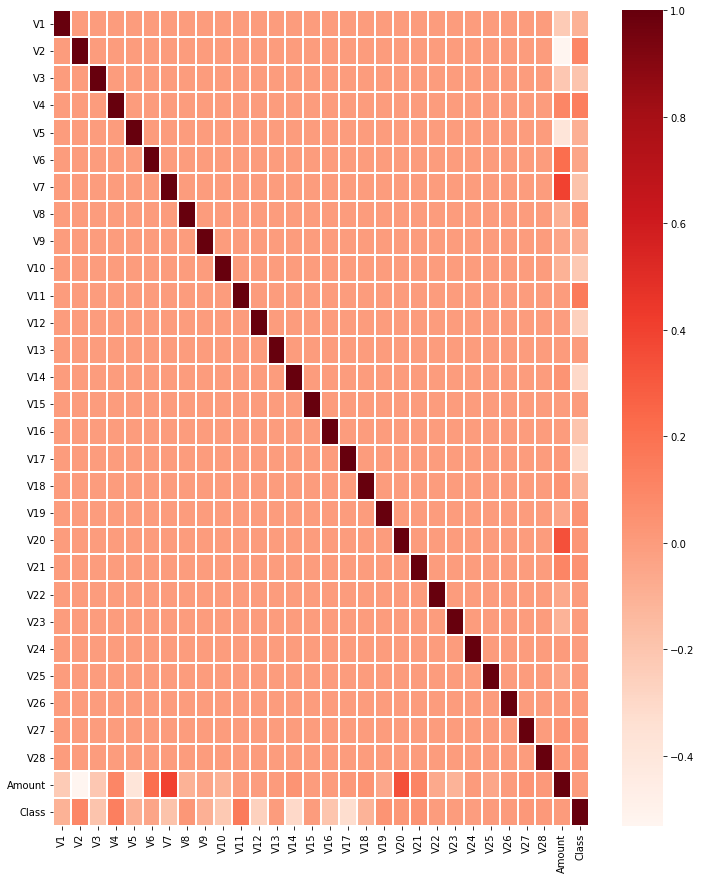

In [23]:
plt.figure(figsize=(12, 15))
sns.heatmap(corrmat,xticklabels=corrmat.columns,yticklabels=corrmat.columns,linewidths=.1,cmap="Reds")
plt.show()

As expected, there is no notable correlation between features V1-V28. There are direct correlation with V7 and V20 of Amount and inverse correlation with V1 and V5 of Amount.

#### 3.g. Outlier Removal

In [24]:
# use z-score to remove outliers
for c in ncols:
    upper_limit = df[c].mean() + 3*df[c].std()
    lower_limit = df[c].mean() - 3*df[c].std()
    df[c] = np.where(
        df[c]>upper_limit,
        upper_limit,
        np.where(
            df[c]<lower_limit,
            lower_limit,
            df[c]
        )
    )

df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [25]:
#check class balance again for dependent variable
temp2 = df["Class"].value_counts()
df2 = pd.DataFrame({'label': temp.index,'count': temp.values})
df2.head

<bound method NDFrame.head of    label   count
0      0  284315
1      1     492>

Even with outliers removal, data is still imbalanced.

### 4. Feature Engineering

As all the features are numeric, no feature encoding is required.

### 5. Declare feature vector and target variable

In [72]:
X = df.drop(['Class'], axis=1)

y = df['Class']


### 6.a. Split data into separate training and test set

In [27]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

### 6.b Check the shape of X_train and X_test

In [28]:
# check the shape of X_train and Y_train
X_train.shape, y_train.shape

((199364, 29), (199364,))

In [29]:
# check the shape of X_test and Y_test
X_test.shape, y_test.shape

((85443, 29), (85443,))

### 7. Feature Scaling

In [30]:
X_train.columns


Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount'],
      dtype='object')

In [31]:

column_names = X_train.columns
column_names

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount'],
      dtype='object')

In [32]:

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform( X_train )
X_test = sc.transform( X_test )

In [33]:
X_train.shape

(199364, 29)

In [34]:
X_train = pd.DataFrame(X_train, columns=[column_names])
X_train.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-0.106641,0.060065,-0.480713,-0.714859,1.549181,1.398705,0.514657,0.782013,0.023924,-0.384760,...,-0.117456,-0.117467,0.004957,0.655942,-3.026645,-1.775381,0.714842,1.072461,0.364513,-0.205869
1,1.233913,-0.011079,-1.101591,0.088432,0.509322,-0.261220,0.203029,-0.392494,0.372137,0.050329,...,-0.162700,-0.708824,-1.114309,0.698482,0.109752,-0.275224,0.433339,-0.262171,-0.290865,-0.516408
2,-0.079705,0.105429,1.116950,0.502165,0.187611,0.887968,1.643865,-1.484395,0.732541,1.579631,...,0.105397,0.054953,1.497942,-1.082168,1.203376,-0.346756,-1.288665,-4.299257,-4.903788,0.620770
3,0.774613,-0.431944,0.385563,-0.449752,-0.981142,-0.677192,-0.678161,-0.089245,-0.613479,0.706605,...,-0.125362,-0.011829,-0.256959,0.463313,0.578777,0.297045,-0.847977,0.029979,0.074331,-0.489487
4,-0.934636,0.474452,0.428850,-0.400413,0.713253,-0.406097,1.025172,-0.174019,-0.051820,-1.130399,...,-0.138130,-0.469881,-0.557116,-0.568231,0.979728,1.347060,1.096099,0.212635,0.723017,0.078629


In [35]:
X_test = pd.DataFrame(X_test, columns=[column_names])
X_test.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-0.220192,0.788399,-0.048019,-0.433737,1.074922,-0.067954,1.208210,-0.209233,-0.158112,-1.809321,...,0.362722,-0.437896,-0.614574,-0.690577,-0.078080,0.415844,0.021381,0.367495,0.791502,-0.259238
1,-0.235856,0.692732,0.089447,-0.469790,0.997916,-0.581471,1.052044,-0.139517,-0.279054,-1.306941,...,-0.182806,-0.580682,-1.177871,-0.083740,0.815814,-0.810554,0.286939,0.254699,0.862843,-0.516408
2,-0.986851,-1.866207,0.221072,0.486442,2.023800,-1.415442,-1.198570,0.385290,0.865330,-0.225049,...,0.812827,1.575171,1.597853,2.528344,1.067228,-3.116824,-2.189440,1.000826,2.157626,0.119551
3,-1.498880,0.637552,1.022632,0.765159,-1.590481,1.668941,0.529293,-0.365068,-0.239774,0.166247,...,-1.901439,1.816716,0.974003,0.389862,-0.434725,0.005279,-0.370774,-1.835939,-3.272859,1.553537
4,0.766594,-0.441355,0.516501,-0.148281,-0.951951,-0.415296,-0.844965,-0.129836,0.954025,0.144403,...,-0.241364,-0.287969,-0.107911,0.171886,0.554463,0.749292,-0.562190,-0.028851,0.010617,-0.495980


### 8.Model Building

In [36]:
# train a Gaussian Naive Bayes classifier on the training set
from sklearn.naive_bayes import GaussianNB

In [37]:
#create model instance
model= GaussianNB()

In [38]:
#fit the model
model.fit(X_train, y_train)

GaussianNB()

### 9. Make predictions

In [39]:
y_pred = model.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

### 10. Retrieve accuracy score

In [40]:
# test accuracy
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.979623842795782

In [41]:
# training accuracy
y_pred_train = model.predict(X_train)
y_pred_train
accuracy_score(y_train, y_pred_train)

0.9790935173852852

The training-set accuracy score is 0.9790935173852852 while the test-set accuracy to be 0.979623842795782. These two values are quite comparable. So, there is no sign of overfitting.

In [42]:
#generate confusion matrix
from sklearn.metrics import confusion_matrix

mat = confusion_matrix(y_test, y_pred)

print('Confusion matrix\n\n', mat)

print('\nTrue Positives(TP) = ', mat[0,0])

print('True Negatives(TN) = ', mat[1,1])

print('False Positives(FP) = ', mat[0,1])

print('False Negatives(FN) = ', mat[1,0])


Confusion matrix

 [[83577  1719]
 [   22   125]]

True Positives(TP) =  83577
True Negatives(TN) =  125
False Positives(FP) =  1719
False Negatives(FN) =  22


The confusion matrix shows 83577 + 125 = 7896 correct predictions and 1719 + 22 = 1873 incorrect predictions.

In this case, we have

- True Positives (Actual Positive:1 and Predict Positive:1) - 83577
- True Negatives (Actual Negative:0 and Predict Negative:0) - 125
- False Positives (Actual Negative:0 but Predict Positive:1) - 1719 (Type I error)
- False Negatives (Actual Positive:1 but Predict Negative:0) - 22 (Type II error)

<AxesSubplot:>

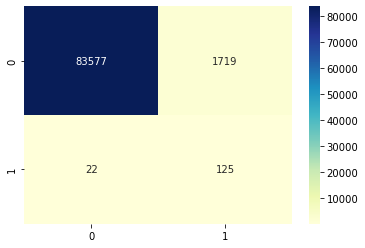

In [43]:
# visualize confusion matrix with seaborn heatmap

cm_matrix = pd.DataFrame(data=mat, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(mat, annot=True, fmt='d', cmap='YlGnBu')

In [44]:
#print classification report
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     85296
           1       0.07      0.85      0.13       147

    accuracy                           0.98     85443
   macro avg       0.53      0.92      0.56     85443
weighted avg       1.00      0.98      0.99     85443



### 11. Calculate class probabilities

In [45]:
#print the first 10 predicted probabilities of two classes- 0 and 1
y_pred_prob = model.predict_proba(X_test)[0:10]
y_pred_prob

array([[1.00000000e+00, 1.98383240e-14],
       [1.00000000e+00, 8.05360569e-16],
       [1.00000000e+00, 4.46829240e-12],
       [1.00000000e+00, 1.00163753e-11],
       [1.00000000e+00, 8.06384367e-14],
       [9.99996683e-01, 3.31720422e-06],
       [1.00000000e+00, 9.73396728e-14],
       [1.00000000e+00, 4.95229845e-17],
       [1.00000000e+00, 1.17163067e-13],
       [1.00000000e+00, 5.57657819e-13]])

In each row, the numbers sum to 1.

There are 2 columns which correspond to 2 classes -  and .

Class 0 => Not Fraud.

Class 1 => Fraud.

Importance of predicted probabilities

We can rank the observations by probability of whether a transaction is not fraud or is a fraud.
predict_proba process

Predicts the probabilities

Choose the class with the highest probability

Classification threshold level

There is a classification threshold level of 0.5.

Class 0 => Not fraud is predicted if probability < 0.5.

Class 1 => Fraud is predicted if probability > 0.5.

In [46]:
#store the probabilities in dataframe
y_pred_prob_df = pd.DataFrame(data=y_pred_prob)
y_pred_prob_df

,0,1
0,1.000000,1.983832e-14
1,1.000000,8.053606e-16
2,1.000000,4.468292e-12
3,1.000000,1.001638e-11
4,1.000000,8.063844e-14
5,0.999997,3.317204e-06
6,1.000000,9.733967e-14
7,1.000000,4.952298e-17
8,1.000000,1.171631e-13
9,1.000000,5.576578e-13


In [47]:
# print the first 10 predicted probabilities for class 1 - Probability of >50K
model.predict_proba(X_test)[0:10,1]

array([1.98383240e-14, 8.05360569e-16, 4.46829240e-12, 1.00163753e-11,
       8.06384367e-14, 3.31720422e-06, 9.73396728e-14, 4.95229845e-17,
       1.17163067e-13, 5.57657819e-13])

In [48]:
# store the predicted probabilities for class 1 - Probability of >50K

y_pred1 = model.predict_proba(X_test)[:, 1]

Text(0, 0.5, 'Frequency')

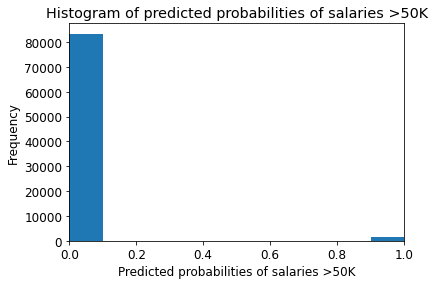

In [49]:
# plot histogram of predicted probabilities
# adjust the font size 
plt.rcParams['font.size'] = 12
# plot histogram with 10 bins
plt.hist(y_pred1, bins = 10)
# set the title of predicted probabilities
plt.title('Histogram of predicted probabilities of salaries >50K')
# set the x-axis limit
plt.xlim(0,1)
# set the title
plt.xlabel('Predicted probabilities of salaries >50K')
plt.ylabel('Frequency')


We can see that the above histogram is highly positive skewed.

The first column tell us that there are approximately > 800000 observations with probability between 0.0 and 0.1 which are not fraud.

There are relatively small number of observations with probability > 0.5. These small number of observations predict that the transactions will be fraud.  Majority of observations predcit that the transactions are not fraud.

### 12. Handle Imbalanced data

In [50]:
!pip install scikit-learn==0.24

In [51]:
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0)))
 
# import SMOTE module from imblearn library
# pip install imblearn (if you don't have imblearn in your system)
#from sklearn.metrics import DistanceMetric
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state = 2)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())
 
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))
 
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

Before OverSampling, counts of label '1': 345
Before OverSampling, counts of label '0': 199019 

After OverSampling, the shape of train_X: (398038, 29)
After OverSampling, the shape of train_y: (398038,) 

After OverSampling, counts of label '1': 199019
After OverSampling, counts of label '0': 199019


In [52]:
#create base model again
model2= GaussianNB()

In [53]:
#fit the model
model.fit(X_train_res, y_train_res)

GaussianNB()

In [54]:
#make the predictions
y_pred_res = model.predict(X_test)
y_pred_res

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [55]:
#test accuracy
accuracy_score(y_test, y_pred_res)

0.9770139157098885

In [56]:
# training accuracy
y_pred_train_res = model.predict(X_train_res)
accuracy_score(y_train_res, y_pred_train_res)

0.9033082268527125

The training-set accuracy score is 0.9033082268527125 while the test-set accuracy to be 0.979623842795782. So, there is some sign of underfitting.

In [57]:
print(classification_report(y_test, y_pred_res))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     85296
           1       0.06      0.85      0.11       147

    accuracy                           0.98     85443
   macro avg       0.53      0.91      0.55     85443
weighted avg       1.00      0.98      0.99     85443



### 13. Hyperparameter tuning

The only parameter to be hyper tuned is var_smoothing.

var_smoothing is a stability calculation to widen (or smooth) the curve and therefore account for more samples that are further away from the distribution mean. In this case, np.logspace returns numbers spaced evenly on a log scale, starts from 0, ends at -9, and generates 100 samples.

This needs to be done to find an optimal combination of hyperparameters that minimizes a predefined loss function to give better results.

In [58]:
from sklearn.preprocessing import PowerTransformer

In [59]:
param_grid_nb = {'var_smoothing': np.logspace(0,-9, num=100)}

In [60]:
from sklearn.model_selection import RepeatedStratifiedKFold
cv_method = RepeatedStratifiedKFold(n_splits=5,  n_repeats=3, random_state=999)

In [61]:
from sklearn.model_selection import GridSearchCV
#estimator is the machine learning model of interest, provided the model has a scoring function; in this case, the model assigned is GaussianNB().
#param_grid is a dictionary with parameters names (string) as keys and lists of parameter settings to try as values; this enables searching over any sequence of parameter settings.
#verbose is the verbosity: the higher, the more messages; in this case, it is set to 1.
#cv is the cross-validation generator or an iterable, in this case, there is a 10-fold cross-validation.
#n_jobs is the maximum number of concurrently running workers; in this case, it is set to -1 which implies that all CPUs are used.

model_nb = GridSearchCV(estimator=GaussianNB(), 
                            param_grid=param_grid_nb, 
                            verbose=1, 
                            cv=cv_method, 
                            n_jobs=-1,
                            scoring='accuracy',
                            
                           )
df_transformed = PowerTransformer().fit_transform(X_test)
model_nb.fit(df_transformed, y_test);

Fitting 15 folds for each of 100 candidates, totalling 1500 fits


In [62]:
model_nb.best_estimator_

GaussianNB(var_smoothing=1.0)

In [63]:
results_NB = pd.DataFrame(model_nb.cv_results_['params'])

In [64]:
results_NB['test_score'] = model_nb.cv_results_['mean_test_score']
results_NB

,var_smoothing,test_score
0,1.000000e+00,0.996824
1,8.111308e-01,0.995389
2,6.579332e-01,0.993785
3,5.336699e-01,0.992404
4,4.328761e-01,0.991012
...,...,...
95,2.310130e-09,0.982663
96,1.873817e-09,0.982663
97,1.519911e-09,0.982663
98,1.232847e-09,0.982663


In [68]:
#predict the target on the test dataset
#To obtain model prediction on testing data to evaluate the model’s accuracy and efficiency.
predict_test = model_nb.predict(df_transformed)

In [69]:
#accuracy Score on test dataset
accuracy_score(y_test,predict_test)

0.9967697763421228

The test accuracy for optimal NB model is 0.9967697763421228.

In [70]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, predict_test), ": is the confusion matrix")

from sklearn.metrics import precision_score
print(precision_score(y_test, predict_test), ": is the precision score")

from sklearn.metrics import recall_score
print(recall_score(y_test, predict_test), ": is the recall score")

from sklearn.metrics import f1_score
print(f1_score(y_test,predict_test), ": is the f1 score")

[[85050   246]
 [   30   117]] : is the confusion matrix
0.32231404958677684 : is the precision score
0.7959183673469388 : is the recall score
0.4588235294117647 : is the f1 score


### Conclusion

Our optimal NB model has a high accuracy of 99.67%.